### Image classification; Backbone of CNN

* learning purpose
    * Understanding the concept of Transfer Learning by knowing the types and concepts of Backbone model, which is a pre-learning model.
    * It'll bring in basic Backbone models like VGG and ResNet and use them.
    * It newly learns as much as the layer wanting the Backbone model and use.
    * As much as I want image classify with Backbone model by Transfering learning.

In [2]:
# Required Message Alert Message Output x
import warnings
warnings.filterwarnings("ignore")

print("set")

set


In [3]:
# version of tensorflow for model design check
import tensorflow as tf
print(tf.__version__)

2.7.0


**1, prepare the dataset for learning model**

In [4]:
# load datasets of tensorflow_datasets
import tensorflow_datasets as tfds

tfds.__version__

'4.4.0'

[Datasets provided by TensorFlow](https://www.tensorflow.org/datasets/catalog/overview)

In [5]:
# load cats_vs_dogs datasets of tensorflow_datasets
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'cats_vs_dogs',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True)

In [6]:
# each dataset check
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


: All datasets are (image, label) shape. = ((None, None, 3), ()) --> (None, None, 3) == (height, width, channel) three-dimension Images, () == shape of label.

**2. Data visualization and Dtaa pre-processing**

In [7]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

print('set')

set


**take function provided tf.data.Dataset**

: This function extracts as many data as received as the argument, generates a new dataset instance, and returns it.

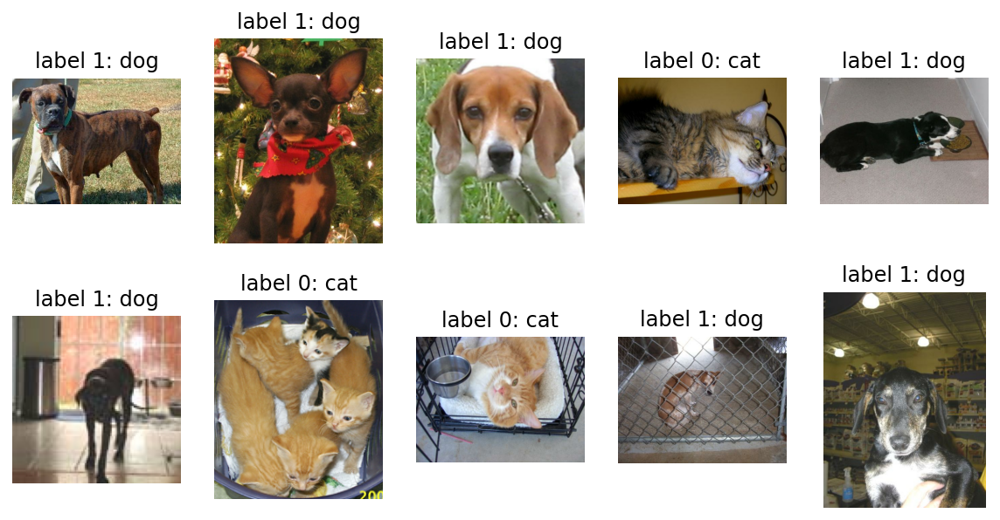

In [8]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # take 10 data
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

**Image resize**

format_example(): format unification.

* Type Casting
    * Type Casting, called type-transformation, means changing the type to another data type. Using a float() to convert an integer type into a float type is an example of Type Casting.

In [9]:
IMG_SIZE = 160 # resizing Image size

def format_example(image, label):
    image = tf.cast(image, tf.float32) # image = float(image) tensorflow version of same type casting
    image = (image/127.5) - 1   # revise scale of same pixel values
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

print('set')

set


: Values between 0~255 are divided into the intermediate value 127.5 and 1 is taken out. Therefore, the float value between -1 ~ 1 is.

In [10]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>


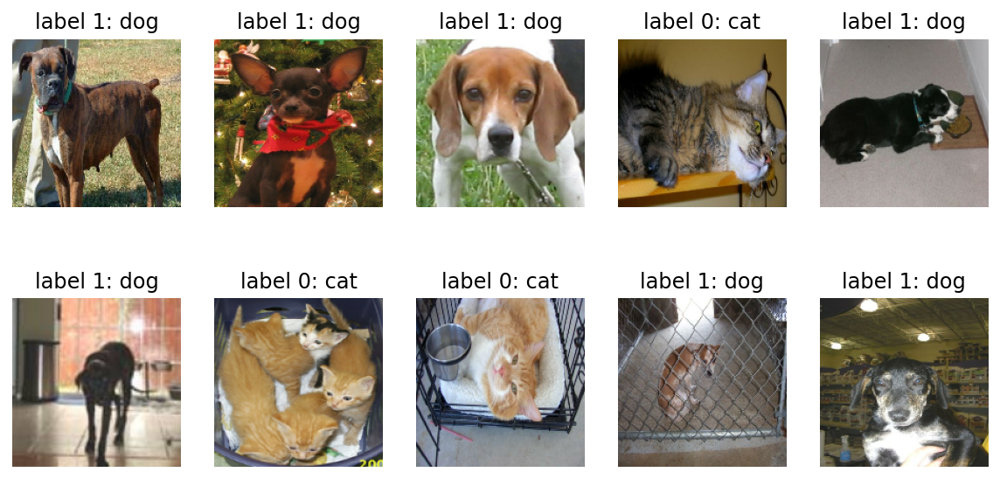

In [11]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx + 1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

: When visualizing the image with matplotlib, all the pixel values should be positve, so the pixel values -1 to 1 are added 1 and divied into 2 and converted into values 0 to 1. 

**3. Model Structure Design using Tensorflow**

In [12]:
# Load the functions required for model generation.
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

print('set')

set


In [13]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3,padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=2, activation='softmax')
])

In [14]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 160, 160, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 80, 80, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 80, 80, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 40, 40, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 40, 40, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 20, 20, 64)       0

: The first dimension represents the number of data. It's marked by the None symbol, "Undetermined Number."None indicates that different numbers of inputs can be entered into the model, depending on the batch size.
One size of data is three dimensions (height, width, channel). As we pass through the six layers, the height and width become smaller and the channel grows larger, and then the shape decreases to one number: 25,600 (20x20x64) by meeting the flatten layer.
The network, which has a smaller and smaller feature map output from CNN (Convolutional Neural Net), and then a one-dimensional shape through Flatten and Dense layers, is the most representative form of the deep learning model using CNN.

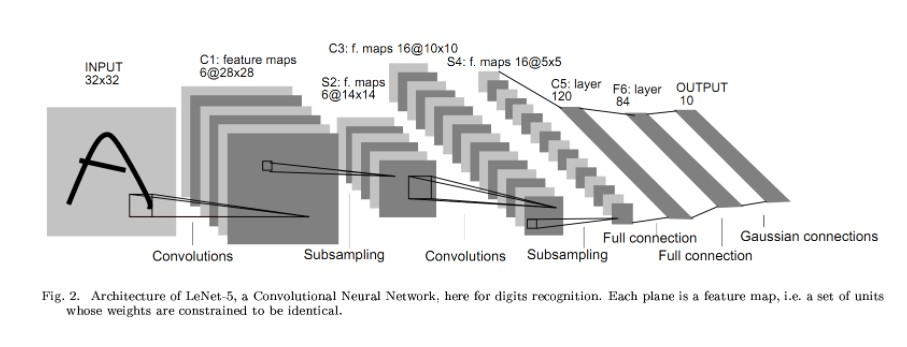

[출처: Gradient-Based Learning Applied to Docoument Recognition](http://yann.lecun.com/exdb/publis/pdf/lecun-01a.pdf)

: When an image is enterd like the left side, the image becomes longer and longer through the Convolutional operation, and when the Flatten layer meets, it is spread out in one line like the right side. It;s a three-dimensional image that's spread out in one dimension.

**★★Understaning Flatten**

In [15]:
import numpy as np

image = np.array([[1, 2], [3, 4]])
print(image.shape)
image

(2, 2)


array([[1, 2],
       [3, 4]])

In [16]:
image.flatten()

array([1, 2, 3, 4])

: All numbers are in row, and passing through the flatten layer in the model is like spreading all the numbers in a row. <br/>
<br/>
Then, the Dense layer is reduced to 512 bides, and the final output generates a probaility distribution of only new numbers. These two numbers is a puppy and the probability that it is a cat.<br/>
<br/>
To summarize, the deep learning model is a function that inputs a three-dimensional image of (160, 160, 3)size, changes the shape through several layers, and finally outputs a few numbers.

**4. After compiling model, learn it**

In [17]:
'''
The paramether called learning rate is set to 0.0001,
and the model is compiled to transform into a form that can be learned.
'''
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

print('set')

set


**To do the compile, three things are needed: optimizer, loss, and metrics.**

* Optimizer determines how to make learning; it also calls it an optimization function because it determines how to optimize it
* Loss determines the direction the model must learn.In this problem, the output of the model is set as a probability distribution for whether the input image is a cat or a puppy, so that if the input image is a cat, the output of the model is close to [1.0, 0.0], and if the image is a puppy, it is closer to [0.0, 1.0].
* Metrics is a measure of the performance of the model.When solving classification problems, indicators that can evaluate performance include accuracy, precision, and recall; here, using accuracy

In [18]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

print('set')

set


: It will make train_batches, validation_batches, and test_batches that randomly sprinkle 32 data according to BATCH_SIZE.Train_batches will continue to provide 32 randomly drawn from the entire data so that the model can be constantly learned.

In [19]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

print('set')

set


In [20]:
# Take only one batch out of the train_batches to check the data
for image_batch, label_batch in train_batches.take(1):
    pass

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

**Performance validation**

In [21]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:2f}".format(accuracy0))

20/20 [==============================] - 5s 189ms/step - loss: 0.7254 - accuracy: 0.4391
initial loss: 0.73
initial accuracy: 0.439063


In [22]:
EPOCHS = 10
history = model.fit(train_batches,
                   epochs=EPOCHS,
                   validation_data=validation_batches)

Epoch 1/10
582/582 [==============================] - 385s 655ms/step - loss: 0.5927 - accuracy: 0.6824 - val_loss: 0.5321 - val_accuracy: 0.7356
Epoch 2/10
582/582 [==============================] - 439s 752ms/step - loss: 0.4665 - accuracy: 0.7796 - val_loss: 0.5188 - val_accuracy: 0.7489
Epoch 3/10
582/582 [==============================] - 481s 823ms/step - loss: 0.3587 - accuracy: 0.8476 - val_loss: 0.5196 - val_accuracy: 0.7562
Epoch 4/10
582/582 [==============================] - 433s 740ms/step - loss: 0.2563 - accuracy: 0.9016 - val_loss: 0.5407 - val_accuracy: 0.7661
Epoch 5/10
582/582 [==============================] - 523s 896ms/step - loss: 0.1610 - accuracy: 0.9476 - val_loss: 0.6453 - val_accuracy: 0.7584
Epoch 6/10
582/582 [==============================] - 410s 701ms/step - loss: 0.0889 - accuracy: 0.9745 - val_loss: 0.7410 - val_accuracy: 0.7605
Epoch 7/10
582/582 [==============================] - 377s 645ms/step - loss: 0.0471 - accuracy: 0.9890 - val_loss: 0.9362 -

* The first accuracy of the training dataset is.
    * Accuracy of data being learned.
* The second val_accuracy is the accuracy of the validation dataset.
    * Accuracy of data that is not being learned, that is, not seen in the corresponding learning step.

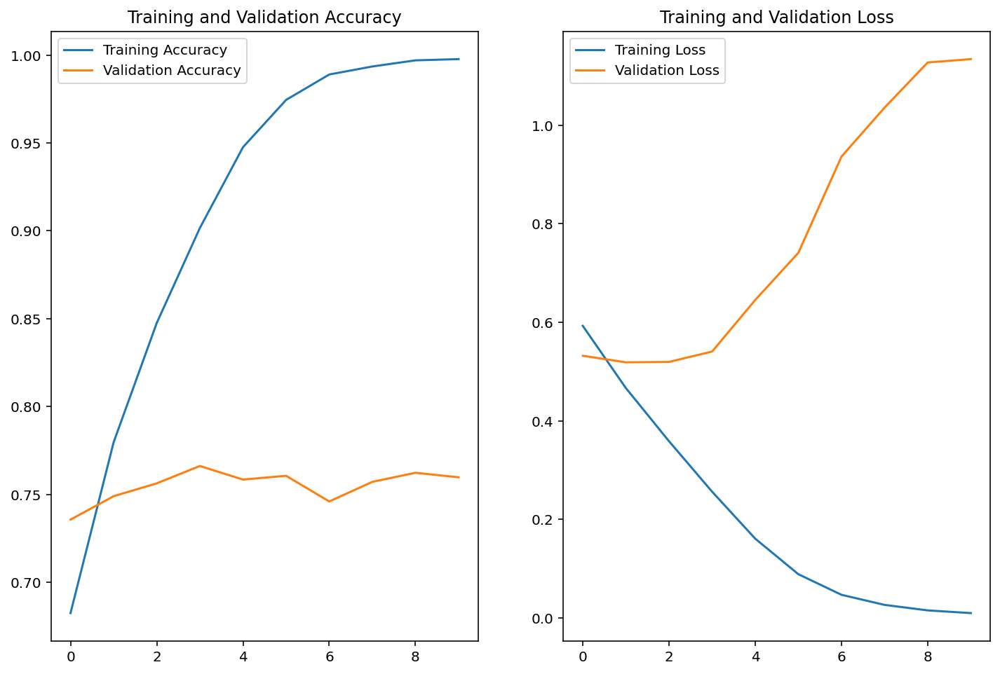

In [28]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

: Training accuracy rises steadily, but validation accuracy does not seem to exceed any limit. Even in the loss graph, training loss is steadily reduced, but the valuation loss value is increased again after a certain moment.

Overfitting.To improve the performance of the model properly, the performance should be good for "unlearning" data, but as we continue to study with only training data, it becomes excessively fit for the data and the generalization ability is lowered.

In [29]:
# checking a model prediction value
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.9993706e-01, 6.2965410e-05],
       [9.1224259e-01, 8.7757394e-02],
       [3.2676005e-01, 6.7323995e-01],
       [9.9968016e-01, 3.1985398e-04],
       [9.5434755e-01, 4.5652464e-02],
       [9.9458814e-01, 5.4118279e-03],
       [6.0315980e-03, 9.9396837e-01],
       [4.0670231e-02, 9.5932978e-01],
       [8.7229764e-01, 1.2770234e-01],
       [8.2799256e-01, 1.7200740e-01],
       [3.3292531e-03, 9.9667078e-01],
       [9.9999726e-01, 2.7834924e-06],
       [9.9997449e-01, 2.5554156e-05],
       [2.8837119e-05, 9.9997115e-01],
       [9.8656487e-01, 1.3435149e-02],
       [9.9999893e-01, 1.0946845e-06],
       [2.2130050e-02, 9.7786987e-01],
       [9.2025021e-10, 1.0000000e+00],
       [9.9999511e-01, 4.9031778e-06],
       [9.9773008e-01, 2.2699342e-03],
       [9.9957687e-01, 4.2313628e-04],
       [9.9998808e-01, 1.1913940e-05],
       [1.0000000e+00, 7.7296400e-09],
       [9.9475420e-01, 5.2457470e-03],
       [9.9977976e-01, 2.2024970e-04],
       [3.2574135e-06, 9.

In [30]:
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 1, 1], dtype=int64)

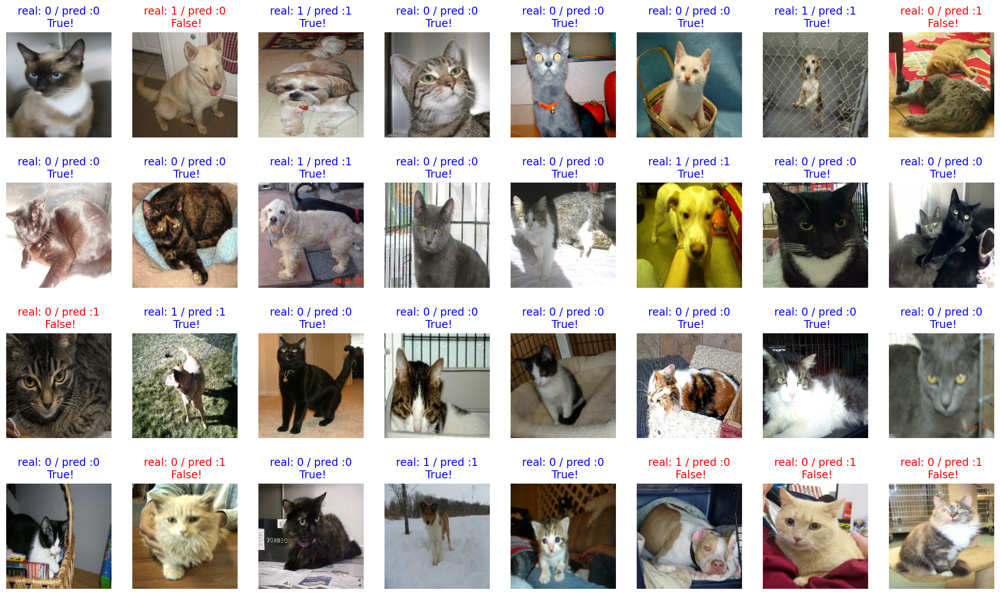

In [31]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [34]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1
        
print(count / 32 * 100)

78.125


**5. Transfer learning - VGG16 Model**

In [35]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

58900480/58889256 [==============================] - 6s 0us/step


In [36]:
image_batch.shape

TensorShape([32, 160, 160, 3])

In [37]:
# feature vector
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [38]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 160, 160, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 160, 160, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 80, 80, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 80, 80, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 80, 80, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 40, 40, 128)       0     

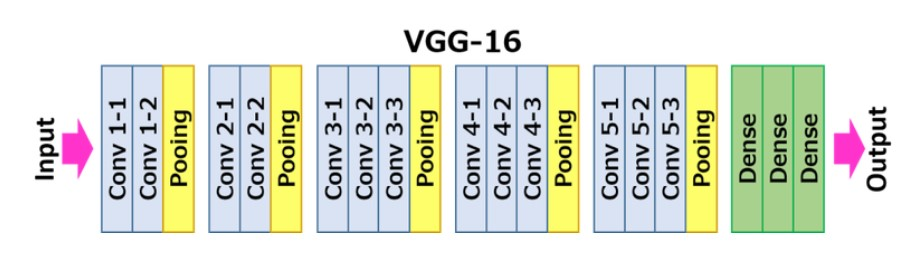

[출처:  VGG16 – Convolutional Network for Classification and Detection](https://neurohive.io/en/popular-networks/vgg16/)

: The VGG16 model has the same structure as above.

However, because this model will be transfer learning without using it, Dense Layers will not be used and will be made.

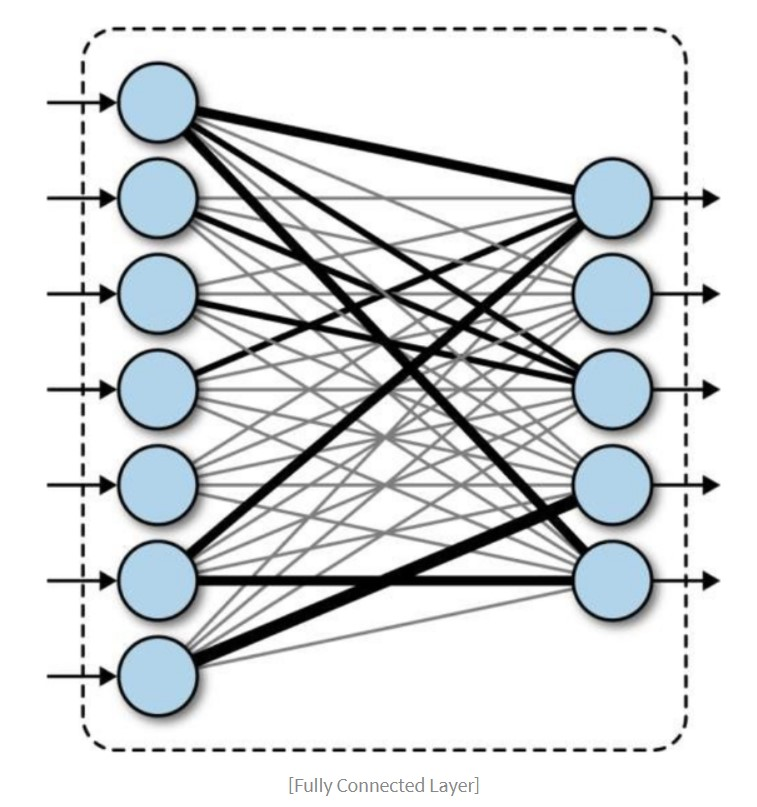

<https://www.researchgate.net/figure/Types-of-pooling-d-Fully-Connected-Layer-At-the-end-of-a-convolutional-neural-network_fig3_337105858>

In [41]:
feature_batch.shape

TensorShape([32, 5, 5, 512])

: The vectors that can be input into the solution- Fully connected layer must be one-dimentional, so this three-dimentional vector must be converted into one-dimensional vectors.

**!!! Global Average Pooling**

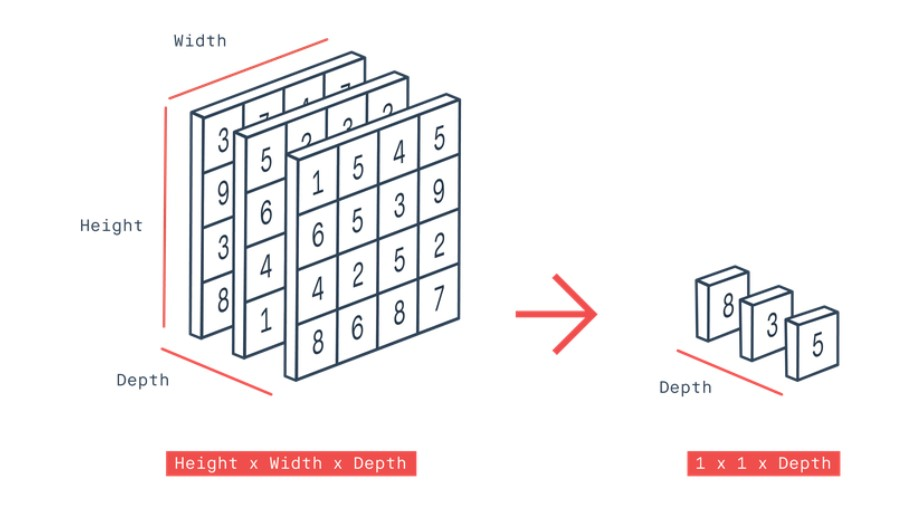

[출처: Global Average Pooling](https://peltarion.com/knowledge-center/documentation/modeling-view/build-an-ai-model/blocks/global-average-pooling-2d)

: Global Average Pooling is a technique that reduces the average of two-dimensional arrays stacked in layer to one value when there is a three-dimensional vector as above.
<br/>
<br/>
In other words, the method of reducing the dimension of the vector by using the mean value is called Global Average Pooling.


In [43]:
# Global Average Pooling
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [44]:
dense_layer = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(2, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 2)


* [the reason why using the activation function](https://ganghee-lee.tistory.com/30)
* [activation function of deep learning](https://ynebula.tistory.com/42)

: After the feature is extracted by being inputted into VGG16 and base_model, which will extract the feature from the image at first, the feature vector passes through the global_average_layer and finally passes to the prediction_layer, predicting whether it is a puppy or a cat

In [45]:
base_model.trainable = False  # the base_model will not do the learning, so the trainable variable
                              # that determines whether to learn is specified as False.
model = tf.keras.Sequential([
    base_model,
    global_average_layer,
    dense_layer,
    prediction_layer
])    

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 5, 5, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense_2 (Dense)             (None, 512)               262656    
                                                                 
 dense_3 (Dense)             (None, 2)                 1026      
                                                                 
Total params: 14,978,370
Trainable params: 263,682
Non-trainable params: 14,714,688
_________________________________________________________________


**6. Final Learning**

In [47]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 [==============================] - 51s 3s/step - loss: 0.9048 - accuracy: 0.4703
initial loss: 0.90
initial accuracy: 0.47


In [48]:
EPOCHS = 5  # It converges much faster than befor, so 5Epoch

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/5
582/582 [==============================] - 2739s 5s/step - loss: 0.2504 - accuracy: 0.9113 - val_loss: 0.1820 - val_accuracy: 0.9269
Epoch 2/5
582/582 [==============================] - 2585s 4s/step - loss: 0.1579 - accuracy: 0.9367 - val_loss: 0.1512 - val_accuracy: 0.9364
Epoch 3/5
582/582 [==============================] - 2527s 4s/step - loss: 0.1452 - accuracy: 0.9397 - val_loss: 0.1609 - val_accuracy: 0.9304
Epoch 4/5
582/582 [==============================] - 2548s 4s/step - loss: 0.1385 - accuracy: 0.9434 - val_loss: 0.1456 - val_accuracy: 0.9407
Epoch 5/5
582/582 [==============================] - 2517s 4s/step - loss: 0.1341 - accuracy: 0.9450 - val_loss: 0.1388 - val_accuracy: 0.9424


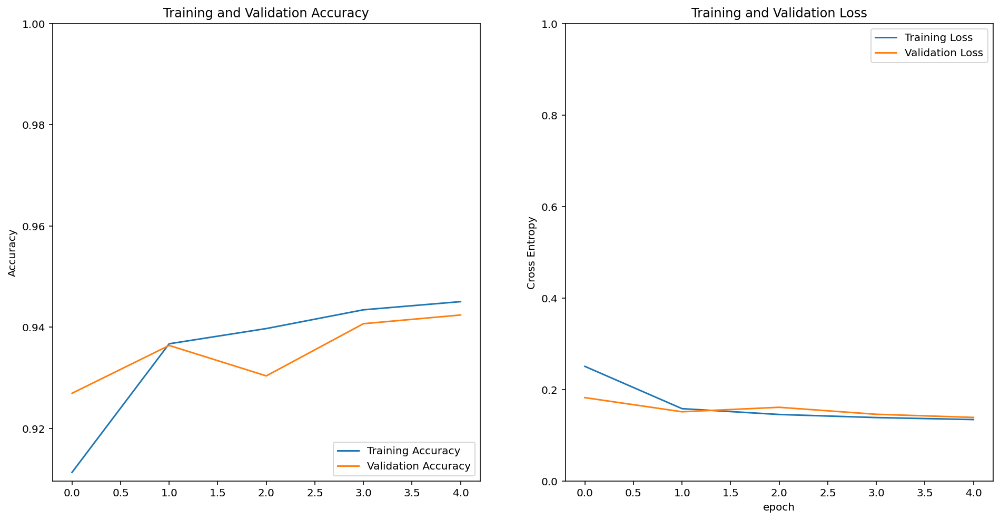

In [49]:
# visualizating
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()), 1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

**Prediction result confirmation**

In [50]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.9999082e-01, 9.1458651e-06],
       [1.2688377e-01, 8.7311620e-01],
       [4.0164861e-01, 5.9835142e-01],
       [9.9999619e-01, 3.8569669e-06],
       [9.9765968e-01, 2.3402961e-03],
       [9.8617399e-01, 1.3825953e-02],
       [2.1169957e-04, 9.9978834e-01],
       [6.6186607e-01, 3.3813393e-01],
       [9.6063989e-01, 3.9360136e-02],
       [9.6276999e-01, 3.7230033e-02],
       [4.1037601e-05, 9.9995899e-01],
       [9.9996305e-01, 3.6963189e-05],
       [9.8803747e-01, 1.1962495e-02],
       [5.4055631e-06, 9.9999464e-01],
       [9.9849606e-01, 1.5038863e-03],
       [9.8435855e-01, 1.5641432e-02],
       [9.9678266e-01, 3.2173791e-03],
       [3.6775161e-02, 9.6322489e-01],
       [6.3679689e-01, 3.6320317e-01],
       [9.9524683e-01, 4.7531649e-03],
       [9.1083574e-01, 8.9164279e-02],
       [9.8299992e-01, 1.7000092e-02],
       [9.9487215e-01, 5.1278383e-03],
       [9.7913408e-01, 2.0865912e-02],
       [9.9842668e-01, 1.5733234e-03],
       [9.8235577e-01, 1.

In [51]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0], dtype=int64)

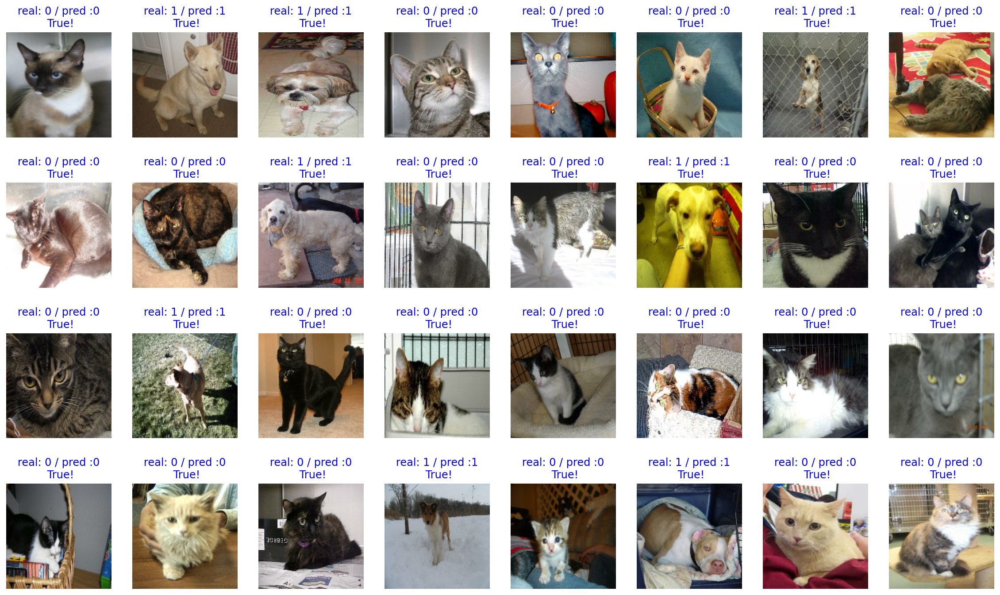

In [52]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

: Surely using a well-educated model worked well.

In [53]:
count = 0
for image, label, prediction in zip (images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1
        
print(count / 32 * 100)

100.0
